# Подготовка данных

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

Посмотрим на данные.

In [2]:
df = pd.read_csv('./data/survey_results_public.csv')
df.head(2).T

,0,1
ResponseId,1,2
MainBranch,I am a developer by profession,I am a student who is learning to code
Employment,"Independent contractor, freelancer, or self-em...","Student, full-time"
Country,Slovakia,Netherlands
US_State,NaN,NaN
UK_Country,NaN,NaN
EdLevel,"Secondary school (e.g. American high school, G...","Bachelor’s degree (B.A., B.S., B.Eng., etc.)"
Age1stCode,18 - 24 years,11 - 17 years
LearnCode,Coding Bootcamp;Other online resources (ex: vi...,"Other online resources (ex: videos, blogs, etc..."
YearsCode,NaN,7


In [3]:
df.shape[0]

83439

Наша основная цель -- предсказывать **ConvertedCompYearly**.

## Препроцессинг

Сначала, выбросим ненужное и то, что позволяет "заглянуть" в таргет.

In [4]:
df.dropna(subset=['ConvertedCompYearly'], inplace=True)
df.drop(['ResponseId', 'CompTotal', 'CompFreq'], axis=1, inplace=True)

In [5]:
df.shape[0]

46844

Также выбросим вещи, которые по каким-то причинам не нужны либо их нельзя использовать (например, из-за того, что в данных слишком много пропусков).

In [6]:
columns_to_drop = [
    'US_State', # most of this data is missing
    'UK_Country', # most of this data is missing
    
    # I have no idea if these can bring something useful...
    'Trans',
    'Sexuality',
    'Accessibility',
    'MentalHealth',
    
    # these features showed high correlation with
    # corresponding 'xxxHaveToWorkWith'
    'LanguageWantToWorkWith',
    'DatabaseWantToWorkWith',
    'PlatformWantToWorkWith',
    'WebframeWantToWorkWith',
    'MiscTechWantToWorkWith',
    'ToolsTechWantToWorkWith',
    'NEWCollabToolsWantToWorkWith'
]

df.drop(columns_to_drop, axis=1, inplace=True)

Для неокторых категориальных признаков есть очень много возможных категорий. Мы оставим top-5, остальное пойдет в категорию Other.

In [7]:
def leave_top_k(col, k=5):
    top_k = df[col].value_counts()[:k].keys()
    df[col] = df[col].mask(~df[col].isin(top_k), 'Other')

    
for col in ['Country', 'EdLevel', 'Age1stCode', 'OrgSize', 'Currency', 'Gender', 'Ethnicity']:
    leave_top_k(col)

Сделаем YearsCode и YearsCodePro числовыми

In [8]:
for col in ['YearsCode', 'YearsCodePro']:
    df[col] = df[col].mask(df[col] == 'Less than 1 year', 0)
    df[col] = df[col].mask(df[col] == 'More than 50 years', 50)
    # just drop observations that do not have info
    df = df[~df[col].isna()]
    # cast to int type

df = df.astype({ 'YearsCode': 'int32', 'YearsCodePro': 'int32'})

Проверим распределение зарплат.

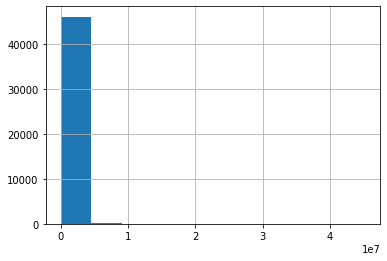

In [9]:
df['ConvertedCompYearly'].hist();

Отфильтруем выбросы

In [10]:
df = df[
    (df['ConvertedCompYearly'] > df['ConvertedCompYearly'].quantile(.05)) &
    (df['ConvertedCompYearly'] < df['ConvertedCompYearly'].quantile(.95))
]

Снова проверим распределение зарплат. Сейчас все должно быть хорошо.

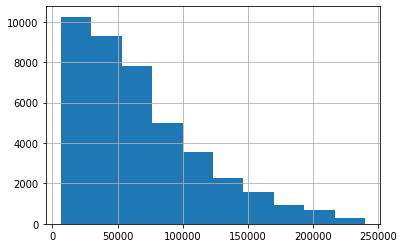

In [11]:
df['ConvertedCompYearly'].hist();

Сгенерируем признаки из текстовых данных. К примеру, если человек ответил

LanguageHaveWorkedWith -> JavaScript, HTML/CSS

то будут сгенерированы признаки

* LanguageHaveWorkedWith_JavaScript True
* LanguageHaveWorkedWith_HTML/CSS	True
* LanguageHaveWorkedWith_SQL False

In [12]:
from collections import Counter

def generate_features_from_multiple_choices(col, k=3):
    """
    k is a maximal number of features to be generated
    """
    cnt = Counter()
    for el in df[col]:
        for feature in str(el).split(';'):
            cnt[feature] += 1
    del cnt['nan']
    
    for feature in [el[0] for el in cnt.most_common(k)]:
        df[f'{col}_{feature}'] = df[col].apply(lambda text: feature in str(text))
    df.drop(col, axis=1, inplace=True)

        
for col in ['LearnCode',
            'DevType',
            'LanguageHaveWorkedWith',
            'DatabaseHaveWorkedWith',
            'PlatformHaveWorkedWith',
            'WebframeHaveWorkedWith',
            'MiscTechHaveWorkedWith',
            'ToolsTechHaveWorkedWith',
            'NEWCollabToolsHaveWorkedWith',
            'NEWStuck',
            'NEWSOSites'
           ]:
    generate_features_from_multiple_choices(col)

Посмотрим на то, что получилось!

In [13]:
df.shape

(41636, 54)

In [14]:
df.head(1).T

,9
MainBranch,I am a developer by profession
Employment,Employed full-time
Country,Other
EdLevel,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)"
Age1stCode,11 - 17 years
YearsCode,7
YearsCodePro,4
OrgSize,Other
Currency,Other
OpSys,Linux-based


Признаки Age и Age1stCode тоже сделаем числовыми

In [15]:
df = df[(df['Age'].notna()) & (df['Age'] != 'Under 18 years old') &
   (df['Age'] != 'Prefer not to say') & (df['Age'] != '65 years or older') & (df['Age1stCode'] != 'Other')]

look_up_age = {'25-34 years old': 29.5, '45-54 years old': 29.5, '35-44 years old': 39.5,
       '18-24 years old': 21, '55-64 years old': 59.5}
look_up_age_1st_code = {'11 - 17 years': 14, '5 - 10 years': 7.5, '25 - 34 years': 29.5, '18 - 24 years': 21,
       '35 - 44 years': 39.5}
age = df['Age'].apply(lambda v: look_up_age[v])
age_1st_code = df['Age1stCode'].apply(lambda v: look_up_age_1st_code[v])
df = df.drop(columns=['Age', 'Age1stCode'])
df['Age'] = age
df['Age1stCode'] = age_1st_code
df.head(1).T

,9
MainBranch,I am a developer by profession
Employment,Employed full-time
Country,Other
EdLevel,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)"
YearsCode,7
YearsCodePro,4
OrgSize,Other
Currency,Other
OpSys,Linux-based
SOVisitFreq,Multiple times per day


Заполним пропуски и сохраним данные

In [16]:
df = df.fillna('N/A')

In [17]:
df.to_csv('./data/processed/full_data.csv', index=False)

In [18]:
X = df.drop('ConvertedCompYearly', axis=1)
y = df['ConvertedCompYearly']

Разобьем нашу выборку на train, val и test: 

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

Сохраним в csv, чтобы в любой момент потом можно было восстановить:

In [20]:
X_train.to_csv('./data/processed/X_train.csv', index=False)
X_val.to_csv('./data/processed/X_val.csv', index=False)
X_test.to_csv('./data/processed/X_test.csv', index=False)

In [21]:
y_train.to_csv('./data/processed/y_train.csv', index=False)
y_val.to_csv('./data/processed/y_val.csv', index=False)
y_test.to_csv('./data/processed/y_test.csv', index=False)

Для некоторых алгоритмов будет нужен one hot encoding

In [22]:
def ohe(df: pd.DataFrame):
    X = df.drop('ConvertedCompYearly', axis=1)
    y = df['ConvertedCompYearly']
    
    cat_cols = X.select_dtypes(include=['object']).columns
    for col in  cat_cols:
        X = pd.concat([X.drop(col, axis=1),
                       pd.get_dummies(X[col], prefix=col, prefix_sep='_', drop_first=True)],
                       axis=1)
    
    return X, y
    
X_ohe, y_ohe = ohe(df)

# Поиск причинно-следственных связей

Импортируем нужные библиотеки

In [23]:
import numpy as np
import pandas as pd

import dowhy
from dowhy import CausalModel
import pygraphviz


# these non-covergence warnings are very annoyning, we'll disable them
import warnings
from sklearn.exceptions import DataConversionWarning, ConvergenceWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)
warnings.filterwarnings(action='ignore', category=FutureWarning)

In [24]:
# dataset = pd.read_csv('./data/processed/full_data.csv')
dataset = df.copy()

### Препроцессинг

Здесь сделаем небольшой препроцессинг, специфический для поиска причинно-следственных связей. В частности, treatment может быть только бинарным, поэтому в основном весь препроцессинг состоит в том, чтобы преобразовать небинарный категориальный признак в бинарный (при этом теряя некоторую информацию об остальных категориях).

Задачи которые мы хотим посмотреть:

* ~~влияет ли пол на заработную плату~~,
* ~~влияет ли трудоустройство на полную ставку на зарплату~~,
* интересно, как влияет на зарплату то, что человек часто посещает StackOverflow,
* если есть степень (Ph.D.), повышает ли это шансы на более высокую зарплату?

Сначала переделаем нашу задачу в задачу классификации. Пакету DoWhy не очень нравится делать оценки для регрессии :( По крайней мере это сложнее, кроме того разброс в оцениваемых эффектах был в разы больше.

Будем считать зарплату высокой, если она больше медианной.

In [25]:
dataset['high_salary'] = dataset['ConvertedCompYearly'] > dataset['ConvertedCompYearly'].median()
dataset.drop('ConvertedCompYearly', axis=1, inplace=True)

In [26]:
dataset['frequent_visit_SO'] = dataset['SOVisitFreq'] == 'Multiple times per day'
dataset.drop('SOVisitFreq', axis=1, inplace=True)

dataset['has_phd'] = dataset['EdLevel'] == 'Other doctoral degree (Ph.D., Ed.D., etc.)'

Проверим, что все ок после нашего препроцессинга

In [27]:
assert dataset['frequent_visit_SO'].sum() != 0
assert dataset['has_phd'].sum() != 0

### Модель 1. Custom causal graph

Опишем как на наш взгляд связаны признаки в данных. Для этого зададим следующий causal graph (тут взяты не все признаки, поскольку признаков очень много и граф был бы необозримым).

In [28]:
# Setting a causal graph
causal_graph = """digraph {
U[label="Unobserved Confounders"];
high_salary;
has_phd;
MainBranch;
Employment;
Country;
Ethnicity;
EdLevel;
YearsCode;
YearsCodePro;
OrgSize;
Currency;
OpSys;
Gender;
Age;
Age1stCode;
YearsCode->YearsCodePro;
Country->Currency;
EdLevel->high_salary;
YearsCode->high_salary;
Employment->YearsCode;
YearsCode->frequent_visit_SO;
YearsCodePro->frequent_visit_SO;
YearsCode->OpSys;
YearsCodePro->OpSys;
Country->Ethnicity;
Country->high_salary;
OrgSize->high_salary;
MainBranch->frequent_visit_SO;
YearsCodePro->high_salary;
Age1stCode->YearsCode;
Age->YearsCode;
Gender->MainBranch;
has_phd->EdLevel;
has_phd->Age;
frequent_visit_SO->high_salary;
Ethnicity->high_salary;
Currency->high_salary;
U->Age1stCode; U->YearsCode; U->Employment;U->high_salary;U->MainBranch;U->has_phd;U->OrgSize;
}"""

Посмотрим, как влияет на заработную плату наличие докторской/кандидатской степени у человека. Для этого в treatment укажем has_phd, а в outcome -- high_salary.

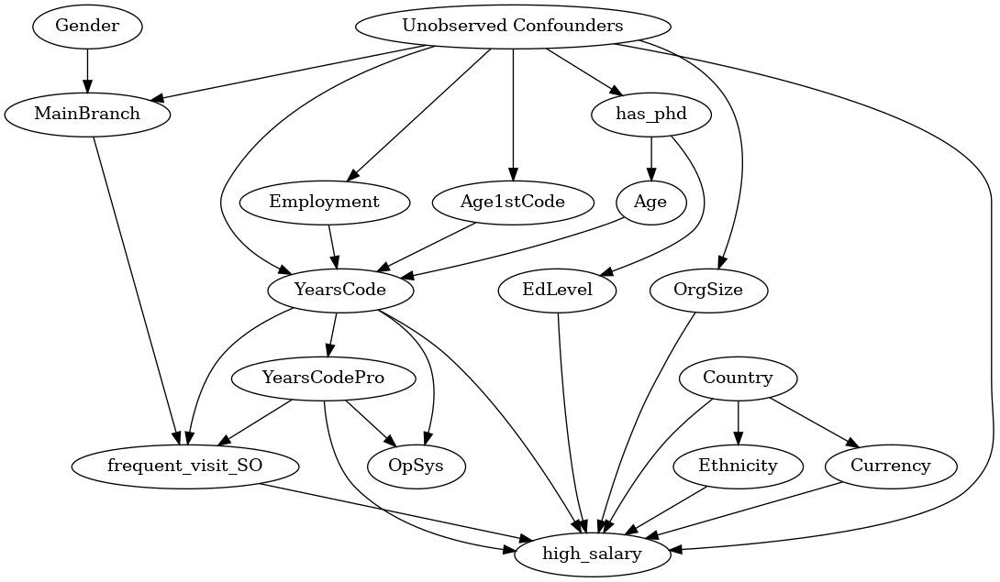

In [29]:
model=CausalModel(
        data=dataset,
        graph=causal_graph.replace('\n', ' '),
        treatment='has_phd',
        outcome='high_salary')

model.view_model()

from IPython.display import Image, display
display(Image(filename="causal_model.png"))

Предположения, которые были сделаны:

* Если есть Ph.D, то возраст у опрашиваемого будет вероятно не меньше 27, то есть has_phd влияет на возраст. Также, наличие степени однозачно определяет EdLevel
* Age1stCode и Age могут определять YearsCode
* YearsCode в свою очередь часто будет совпадать или быть чуть больше чем YearsCodePro
* Неочевидное (и возможно неверное) предположение: число лет опыта влияет на выбор операционной системы (например, популярный тренд для опытных разработчиков --  переходить на MacOS)
* Страна сильно влияет на зарплату, поскольку везде разный уровень жизни

In [30]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
    d                                                                                                          
──────────(Expectation(high_salary|OrgSize,Country,Gender,Employment,Age1stCode,MainBranch,Ethnicity,Currency))
d[has_phd]                                                                                                     
Estimand assumption 1, Unconfoundedness: If U→{has_phd} and U→high_salary then P(high_salary|has_phd,OrgSize,Country,Gender,Employment,Age1stCode,MainBranch,Ethnicity,Currency,U) = P(high_salary|has_phd,OrgSize,Country,Gender,Employment,Age1stCode,MainBranch,Ethnicity,Currency)

### Estimand : 2
Estimand name: iv
No such variable found!

### Estimand : 3
Estimand name: frontdoor
No such variable found!



In [31]:
estimate = model.estimate_effect(identified_estimand,
                                 method_name="backdoor.propensity_score_stratification",
                                 target_units="ate")
print(estimate)

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
    d                                                                                                          
──────────(Expectation(high_salary|OrgSize,Country,Gender,Employment,Age1stCode,MainBranch,Ethnicity,Currency))
d[has_phd]                                                                                                     
Estimand assumption 1, Unconfoundedness: If U→{has_phd} and U→high_salary then P(high_salary|has_phd,OrgSize,Country,Gender,Employment,Age1stCode,MainBranch,Ethnicity,Currency,U) = P(high_salary|has_phd,OrgSize,Country,Gender,Employment,Age1stCode,MainBranch,Ethnicity,Currency)

## Realized estimand
b: high_salary~has_phd+OrgSize+Country+Gender+Employment+Age1stCode+MainBranch+Ethnicity+Currency
Target units: ate

## Estimate
Mean value: 0.15249050329162264



Попробуем random_common_cause. Видим, что оцениваемый эффект практически не поменялся. Это хорошо!

In [32]:
# Adds randomly drawn covariates to data and re-runs the analysis to see if the causal estimate changes or not.
# If our assumption was originally correct then the causal estimate shouldn’t change by much.
refute1_results=model.refute_estimate(identified_estimand, estimate,
        method_name="random_common_cause")
print(refute1_results)

Refute: Add a Random Common Cause
Estimated effect:0.15249050329162264
New effect:0.15901095932888165



Следующим попробуем placebo treatment. Полученный новый эффект должен быть в районе нуля. Так и есть.

In [33]:
# Randomly assigns any covariate as a treatment and re-runs the analysis. If our 
# assumptions were correct then this newly found out estimate should go to 0.
refute2_results=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(refute2_results)

Refute: Use a Placebo Treatment
Estimated effect:0.15249050329162264
New effect:0.0016712462789786938
p value:0.46



Наконец, попробуем data_subset_refuter. Новый эффект не должен сильно отличаться от старого.

In [34]:
#Creates subsets of the data(similar to cross-validation) and checks whether the 
# causal estimates vary across subsets. If our assumptions were correct there shouldn’t be much variation.
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

Refute: Use a subset of data
Estimated effect:0.15249050329162264
New effect:0.15217793382215805
p value:0.5



Таким образом, мы можем с определенной долей уверенности утверждать, что наличие степени не очень сильно, но положительно влияет на зарплату, поскольку мы имеем подтверждение от всех трех refuter'ов.

Объяснить этот факт можно просто: специалисты со степенью чуть более квалифицированны. Ну или степень добавляет плюсик в резюме :)

Впрочем, если бы получился противоположный результат, тоже нашлась бы интерпретация: пока один человек получает степень, второй получает опыт в индустрии, а имея больше опыта, логично, что зарабатывает больше.

Теперь то же самое сделаем для частых визитов на StackOverflow

In [36]:
model=CausalModel(
        data=dataset,
        graph=causal_graph.replace('\n', ' '),
        treatment='frequent_visit_SO',
        outcome='high_salary')

identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                                                                                            
────────────────────(Expectation(high_salary|OrgSize,Country,has_phd,OpSys,Gender,Employment,Age1stCode,MainBranch,Age
d[frequent_visit_SO]                                                                                                  

                                                    
,YearsCodePro,Ethnicity,EdLevel,YearsCode,Currency))
                                                    
Estimand assumption 1, Unconfoundedness: If U→{frequent_visit_SO} and U→high_salary then P(high_salary|frequent_visit_SO,OrgSize,Country,has_phd,OpSys,Gender,Employment,Age1stCode,MainBranch,Age,YearsCodePro,Ethnicity,EdLevel,YearsCode,Currency,U) = P(high_salary|frequent_visit_SO,OrgSize,Country,has_phd,OpSys,Gender,Employment,Age1stCode,MainBranch,Age,YearsCodePro,Ethnicity,EdLevel,

In [37]:
estimate = model.estimate_effect(identified_estimand,
                                 method_name="backdoor.propensity_score_stratification",
                                 target_units="ate")
print(estimate)

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                                                                                            
────────────────────(Expectation(high_salary|OrgSize,Country,has_phd,OpSys,Gender,Employment,Age1stCode,MainBranch,Age
d[frequent_visit_SO]                                                                                                  

                                                    
,YearsCodePro,Ethnicity,EdLevel,YearsCode,Currency))
                                                    
Estimand assumption 1, Unconfoundedness: If U→{frequent_visit_SO} and U→high_salary then P(high_salary|frequent_visit_SO,OrgSize,Country,has_phd,OpSys,Gender,Employment,Age1stCode,MainBranch,Age,YearsCodePro,Ethnicity,EdLevel,YearsCode,Currency,U) = P(high_salary|frequent_visit_SO,OrgSize,Country,has_phd,OpSys,Gender,Employment,Age1stCod

Видим, что получилась очень маленькая оценка. Попробуем random cause

In [38]:
# Adds randomly drawn covariates to data and re-runs the analysis to see if the causal estimate changes or not.
# If our assumption was originally correct then the causal estimate shouldn’t change by much.
refute1_results=model.refute_estimate(identified_estimand, estimate,
        method_name="random_common_cause")
print(refute1_results)

Refute: Add a Random Common Cause
Estimated effect:-0.02555611552317933
New effect:-0.022363633871497517



То, что эффект не сильно поменялся, на самом деле здесь ничего не значит, поскольку величина этого эффекта очень мала. Интересно посмотреть на placebo_treatment

In [39]:
# Randomly assigns any covariate as a treatment and re-runs the analysis. If our 
# assumptions were correct then this newly found out estimate should go to 0.
refute2_results=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(refute2_results)

Refute: Use a Placebo Treatment
Estimated effect:-0.02555611552317933
New effect:-0.00012193930272914263
p value:0.48



Наконец, глянем еще раз на data_subset_refuter

In [40]:
#Creates subsets of the data(similar to cross-validation) and checks whether the 
# causal estimates vary across subsets. If our assumptions were correct there shouldn’t be much variation.
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

Refute: Use a subset of data
Estimated effect:-0.02555611552317933
New effect:-0.024651476127951016
p value:0.32



Получается, что и здесь все три refuter'а подтвердили, что частые заходы на StackOverflow могут свидетельствовать о более низкой зарплате.

Это можно объяснить так: неопытные разработчики заходят на StackOverflow на каждый чих, в то время как опытные пользуются более избирательно.

Но здесь стоит опять оговориться, что доверия к этим результатам меньше, поскольку величина эффекта очень мала.

### Модель 2. Граф по умолчанию.

Попробуем теперь граф по умолчанию. Поскольку признаков очень много, граф получается необозримым.

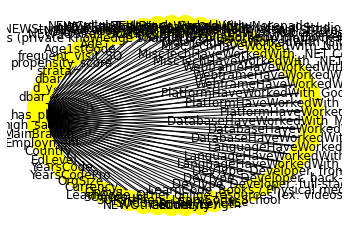

In [45]:
common_causes = [el for el in list(dataset.columns)
                 if el != 'ConvertedCompYearly' and el != 'high_salary' and el != 'has_phd'] + ['']

model=CausalModel(
        data = dataset,
        treatment='has_phd',
        outcome='high_salary',
        common_causes=common_causes)

model.view_model()

Укажем, что мы хотим оценить

In [46]:
#Identify the causal effect
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
    d                                                                                                                 
──────────(Expectation(high_salary|OrgSize,Country,OpSys,SOComm,NEWOtherComms,ToolsTechHaveWorkedWith_Kubernetes,Ethni
d[has_phd]                                                                                                            

                                                                                                                      
city,LearnCode_Other online resources (ex: videos, blogs, etc),WebframeHaveWorkedWith_Angular,ToolsTechHaveWorkedWith_
                                                                                                                      

                                                                                                                      
Docker,NEWSOSites_Stack Overflow,dbar,WebframeHaveWorkedWith_React.js

Сделаем саму оценку

In [47]:
estimate = model.estimate_effect(identified_estimand,
                                 method_name="backdoor.propensity_score_stratification",
                                 target_units="ate")
print(estimate)

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
    d                                                                                                                 
──────────(Expectation(high_salary|OrgSize,Country,OpSys,SOComm,NEWOtherComms,ToolsTechHaveWorkedWith_Kubernetes,Ethni
d[has_phd]                                                                                                            

                                                                                                                      
city,LearnCode_Other online resources (ex: videos, blogs, etc),WebframeHaveWorkedWith_Angular,ToolsTechHaveWorkedWith_
                                                                                                                      

                                                                                                                      
Docker,NEWSOSites_Sta

Видим, что в полном графе наличие степени отрицательно сказывается на заработной плате, хоть и куда слабее.

Наконец, сделаем refutation, чтобы понять насколько были верны наши предположения. Сначала попробуем random_cause. Видим, что что случайный шум может исказить значимость -- новый эффект получился другим.

In [51]:
# Adds randomly drawn covariates to data and re-runs the analysis to see if the causal estimate changes or not.
# If our assumption was originally correct then the causal estimate shouldn’t change by much.
refute1_results=model.refute_estimate(identified_estimand, estimate,
        method_name="random_common_cause")
print(refute1_results)

Refute: Add a Random Common Cause
Estimated effect:-0.10099715409180775
New effect:0.05397811619705561



In [49]:
# Randomly assigns any covariate as a treatment and re-runs the analysis. If our 
# assumptions were correct then this newly found out estimate should go to 0.
refute2_results=model.refute_estimate(identified_estimand, estimate,
                                      method_name="placebo_treatment_refuter", placebo_type="permute")
print(refute1_results)

Refute: Add a Random Common Cause
Estimated effect:-0.10099715409180775
New effect:0.061885830563460864



Интересная ситуация: полученное p-value иногда показывает, что у нас достаточно уверенности в том, что наличие степени влияет на зарплату. Вывод, который можно сделать для себя -- надо проверять несколько refuter'ов, нельзя полагаться на один!

In [50]:
#Creates subsets of the data(similar to cross-validation) and checks whether the 
# causal estimates vary across subsets. If our assumptions were correct there shouldn’t be much variation.
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

Refute: Use a subset of data
Estimated effect:-0.10099715409180775
New effect:0.06755486133418404
p value:0.0



Таким образом, мы видим, что на дефолтном графе никакого влияния обнаружено не было (по крайней мере, оно не было подтверждено), в то время как на нашем кастомном графе было небольшое положительное влияние. Чему верить -- непонятно, но хочется именно кастомному графу, поскольку мы заложили туда знание о предметной области (хоть и не факт, что правильное).

# Обучение моделей

In [52]:
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error
from catboost import CatBoostRegressor

### Catboost

In [53]:
cat_features = ['MainBranch', 'Employment', 'Country', 'EdLevel', 'OrgSize', 'Currency',
                'OpSys', 'SOVisitFreq', 'SOAccount', 'SOPartFreq', 'SOComm', 'NEWOtherComms',
                'Gender', 'Ethnicity', 'SurveyLength', 'SurveyEase']

model = CatBoostRegressor(loss_function='MAE', iterations=2000)
model.fit(X_train, y_train, cat_features=cat_features, eval_set=(X_val, y_val))

0:	learn: 36349.5968249	test: 36177.7377818	best: 36177.7377818 (0)	total: 75.5ms	remaining: 2m 30s
1:	learn: 35781.1758239	test: 35609.4010718	best: 35609.4010718 (1)	total: 89.2ms	remaining: 1m 29s
2:	learn: 35229.5389368	test: 35058.3565461	best: 35058.3565461 (2)	total: 106ms	remaining: 1m 10s
3:	learn: 34706.9492711	test: 34535.9542670	best: 34535.9542670 (3)	total: 120ms	remaining: 60s
4:	learn: 34198.4659401	test: 34032.5800815	best: 34032.5800815 (4)	total: 134ms	remaining: 53.3s
5:	learn: 33704.8323093	test: 33546.1418880	best: 33546.1418880 (5)	total: 147ms	remaining: 49s
6:	learn: 33223.6869169	test: 33066.7699597	best: 33066.7699597 (6)	total: 160ms	remaining: 45.7s
7:	learn: 32768.0137442	test: 32620.0579884	best: 32620.0579884 (7)	total: 177ms	remaining: 44.1s
8:	learn: 32333.5171409	test: 32186.9408326	best: 32186.9408326 (8)	total: 189ms	remaining: 41.9s
9:	learn: 31907.1656332	test: 31761.2303999	best: 31761.2303999 (9)	total: 203ms	remaining: 40.4s
10:	learn: 31503.03

83:	learn: 22488.9796469	test: 22627.1374515	best: 22627.1374515 (83)	total: 1.26s	remaining: 28.7s
84:	learn: 22463.9495214	test: 22604.4737287	best: 22604.4737287 (84)	total: 1.27s	remaining: 28.7s
85:	learn: 22439.4491326	test: 22582.9670298	best: 22582.9670298 (85)	total: 1.29s	remaining: 28.8s
86:	learn: 22414.7695487	test: 22563.8301730	best: 22563.8301730 (86)	total: 1.31s	remaining: 28.8s
87:	learn: 22388.2357518	test: 22541.2168280	best: 22541.2168280 (87)	total: 1.32s	remaining: 28.8s
88:	learn: 22367.1316623	test: 22522.1750836	best: 22522.1750836 (88)	total: 1.34s	remaining: 28.8s
89:	learn: 22348.5167397	test: 22505.6291894	best: 22505.6291894 (89)	total: 1.35s	remaining: 28.8s
90:	learn: 22321.9976190	test: 22480.9420263	best: 22480.9420263 (90)	total: 1.37s	remaining: 28.8s
91:	learn: 22300.3574837	test: 22461.2116754	best: 22461.2116754 (91)	total: 1.39s	remaining: 28.8s
92:	learn: 22276.4171866	test: 22439.8114750	best: 22439.8114750 (92)	total: 1.41s	remaining: 28.8s


171:	learn: 21355.1608647	test: 21692.9656586	best: 21692.9656586 (171)	total: 2.63s	remaining: 27.9s
172:	learn: 21349.6395952	test: 21688.6082680	best: 21688.6082680 (172)	total: 2.64s	remaining: 27.9s
173:	learn: 21342.7644130	test: 21684.4800666	best: 21684.4800666 (173)	total: 2.66s	remaining: 27.9s
174:	learn: 21336.2778831	test: 21678.8682278	best: 21678.8682278 (174)	total: 2.67s	remaining: 27.9s
175:	learn: 21332.3352328	test: 21676.2990751	best: 21676.2990751 (175)	total: 2.69s	remaining: 27.9s
176:	learn: 21327.1312852	test: 21671.8070945	best: 21671.8070945 (176)	total: 2.71s	remaining: 27.9s
177:	learn: 21321.9846768	test: 21669.6842637	best: 21669.6842637 (177)	total: 2.72s	remaining: 27.8s
178:	learn: 21316.9416273	test: 21665.8451725	best: 21665.8451725 (178)	total: 2.73s	remaining: 27.8s
179:	learn: 21311.9030962	test: 21663.3234839	best: 21663.3234839 (179)	total: 2.75s	remaining: 27.8s
180:	learn: 21306.7630212	test: 21660.7584641	best: 21660.7584641 (180)	total: 2.7

252:	learn: 21011.2853976	test: 21470.7021051	best: 21470.7021051 (252)	total: 3.83s	remaining: 26.4s
253:	learn: 21006.7952484	test: 21468.5680451	best: 21468.5680451 (253)	total: 3.84s	remaining: 26.4s
254:	learn: 21003.7108977	test: 21466.2293036	best: 21466.2293036 (254)	total: 3.86s	remaining: 26.4s
255:	learn: 20997.5674823	test: 21460.4613869	best: 21460.4613869 (255)	total: 3.88s	remaining: 26.4s
256:	learn: 20995.2633179	test: 21459.0806926	best: 21459.0806926 (256)	total: 3.89s	remaining: 26.4s
257:	learn: 20991.7975965	test: 21458.1840098	best: 21458.1840098 (257)	total: 3.91s	remaining: 26.4s
258:	learn: 20990.2669042	test: 21456.5703170	best: 21456.5703170 (258)	total: 3.92s	remaining: 26.4s
259:	learn: 20987.7510168	test: 21455.5536926	best: 21455.5536926 (259)	total: 3.94s	remaining: 26.3s
260:	learn: 20985.8570079	test: 21454.4902535	best: 21454.4902535 (260)	total: 3.95s	remaining: 26.3s
261:	learn: 20980.2154281	test: 21450.8560975	best: 21450.8560975 (261)	total: 3.9

345:	learn: 20694.5806233	test: 21279.2392102	best: 21279.2392102 (345)	total: 5.21s	remaining: 24.9s
346:	learn: 20693.0372166	test: 21278.5599630	best: 21278.5599630 (346)	total: 5.23s	remaining: 24.9s
347:	learn: 20690.0947946	test: 21277.1153456	best: 21277.1153456 (347)	total: 5.25s	remaining: 24.9s
348:	learn: 20687.4332295	test: 21276.3259071	best: 21276.3259071 (348)	total: 5.27s	remaining: 24.9s
349:	learn: 20687.0735226	test: 21276.1658479	best: 21276.1658479 (349)	total: 5.28s	remaining: 24.9s
350:	learn: 20685.0321052	test: 21274.9509112	best: 21274.9509112 (350)	total: 5.3s	remaining: 24.9s
351:	learn: 20678.7145786	test: 21269.9601112	best: 21269.9601112 (351)	total: 5.31s	remaining: 24.9s
352:	learn: 20676.7238468	test: 21269.3389422	best: 21269.3389422 (352)	total: 5.33s	remaining: 24.9s
353:	learn: 20675.4235463	test: 21269.0476757	best: 21269.0476757 (353)	total: 5.34s	remaining: 24.8s
354:	learn: 20671.1580021	test: 21267.3139491	best: 21267.3139491 (354)	total: 5.36

439:	learn: 20427.8222735	test: 21169.7234666	best: 21169.7234666 (439)	total: 6.62s	remaining: 23.5s
440:	learn: 20424.2124503	test: 21168.2668127	best: 21168.2668127 (440)	total: 6.63s	remaining: 23.4s
441:	learn: 20420.9162123	test: 21168.1924985	best: 21168.1924985 (441)	total: 6.65s	remaining: 23.4s
442:	learn: 20420.4097755	test: 21168.1263026	best: 21168.1263026 (442)	total: 6.66s	remaining: 23.4s
443:	learn: 20418.3420973	test: 21168.1984583	best: 21168.1263026 (442)	total: 6.67s	remaining: 23.4s
444:	learn: 20415.7426162	test: 21166.9997437	best: 21166.9997437 (444)	total: 6.69s	remaining: 23.4s
445:	learn: 20414.1708238	test: 21166.8017615	best: 21166.8017615 (445)	total: 6.7s	remaining: 23.4s
446:	learn: 20413.2180338	test: 21166.3612908	best: 21166.3612908 (446)	total: 6.72s	remaining: 23.3s
447:	learn: 20411.0659874	test: 21165.5010280	best: 21165.5010280 (447)	total: 6.73s	remaining: 23.3s
448:	learn: 20407.6545549	test: 21164.5827907	best: 21164.5827907 (448)	total: 6.75

531:	learn: 20250.4916806	test: 21120.1101406	best: 21120.0890512 (530)	total: 8.01s	remaining: 22.1s
532:	learn: 20247.4048020	test: 21119.8077978	best: 21119.8077978 (532)	total: 8.02s	remaining: 22.1s
533:	learn: 20244.1247041	test: 21117.8843684	best: 21117.8843684 (533)	total: 8.04s	remaining: 22.1s
534:	learn: 20242.6281493	test: 21117.0716417	best: 21117.0716417 (534)	total: 8.05s	remaining: 22.1s
535:	learn: 20242.1147736	test: 21116.9696316	best: 21116.9696316 (535)	total: 8.07s	remaining: 22s
536:	learn: 20239.1815289	test: 21117.8470069	best: 21116.9696316 (535)	total: 8.09s	remaining: 22s
537:	learn: 20237.4873074	test: 21117.5847052	best: 21116.9696316 (535)	total: 8.1s	remaining: 22s
538:	learn: 20235.0972284	test: 21116.9388589	best: 21116.9388589 (538)	total: 8.12s	remaining: 22s
539:	learn: 20233.7730091	test: 21116.1742373	best: 21116.1742373 (539)	total: 8.14s	remaining: 22s
540:	learn: 20232.9158697	test: 21115.9497976	best: 21115.9497976 (540)	total: 8.15s	remainin

623:	learn: 20118.8977640	test: 21079.0119134	best: 21079.0119134 (623)	total: 9.38s	remaining: 20.7s
624:	learn: 20117.3878173	test: 21077.7065832	best: 21077.7065832 (624)	total: 9.4s	remaining: 20.7s
625:	learn: 20116.8107911	test: 21077.5495304	best: 21077.5495304 (625)	total: 9.41s	remaining: 20.7s
626:	learn: 20115.8749698	test: 21077.1967243	best: 21077.1967243 (626)	total: 9.43s	remaining: 20.6s
627:	learn: 20114.8142323	test: 21076.7919371	best: 21076.7919371 (627)	total: 9.44s	remaining: 20.6s
628:	learn: 20113.9848838	test: 21076.3857979	best: 21076.3857979 (628)	total: 9.46s	remaining: 20.6s
629:	learn: 20112.3525368	test: 21076.0841258	best: 21076.0841258 (629)	total: 9.47s	remaining: 20.6s
630:	learn: 20111.6919571	test: 21075.7956315	best: 21075.7956315 (630)	total: 9.49s	remaining: 20.6s
631:	learn: 20109.4063618	test: 21075.3640471	best: 21075.3640471 (631)	total: 9.5s	remaining: 20.6s
632:	learn: 20108.6774255	test: 21074.9613764	best: 21074.9613764 (632)	total: 9.52s

714:	learn: 20012.5132599	test: 21049.0740704	best: 21049.0740704 (714)	total: 10.7s	remaining: 19.3s
715:	learn: 20012.3574885	test: 21048.9829905	best: 21048.9829905 (715)	total: 10.8s	remaining: 19.3s
716:	learn: 20011.7908988	test: 21048.8227804	best: 21048.8227804 (716)	total: 10.8s	remaining: 19.3s
717:	learn: 20010.6938776	test: 21048.8858199	best: 21048.8227804 (716)	total: 10.8s	remaining: 19.3s
718:	learn: 20008.8755151	test: 21048.5812558	best: 21048.5812558 (718)	total: 10.8s	remaining: 19.3s
719:	learn: 20007.9279731	test: 21048.4973467	best: 21048.4973467 (719)	total: 10.8s	remaining: 19.2s
720:	learn: 20007.3856657	test: 21048.5122805	best: 21048.4973467 (719)	total: 10.8s	remaining: 19.2s
721:	learn: 20005.5956686	test: 21048.5713149	best: 21048.4973467 (719)	total: 10.9s	remaining: 19.2s
722:	learn: 20002.8845443	test: 21048.9576619	best: 21048.4973467 (719)	total: 10.9s	remaining: 19.2s
723:	learn: 20002.1327502	test: 21049.0104631	best: 21048.4973467 (719)	total: 10.

804:	learn: 19918.8100297	test: 21036.7358704	best: 21036.5169863 (803)	total: 12.1s	remaining: 18s
805:	learn: 19917.6134180	test: 21036.1322003	best: 21036.1322003 (805)	total: 12.1s	remaining: 18s
806:	learn: 19915.5334882	test: 21035.4456480	best: 21035.4456480 (806)	total: 12.2s	remaining: 18s
807:	learn: 19914.5695470	test: 21035.2173193	best: 21035.2173193 (807)	total: 12.2s	remaining: 18s
808:	learn: 19914.2451543	test: 21035.1779577	best: 21035.1779577 (808)	total: 12.2s	remaining: 17.9s
809:	learn: 19914.0255043	test: 21035.1829724	best: 21035.1779577 (808)	total: 12.2s	remaining: 17.9s
810:	learn: 19912.6968665	test: 21035.2827445	best: 21035.1779577 (808)	total: 12.2s	remaining: 17.9s
811:	learn: 19912.5852121	test: 21035.2060398	best: 21035.1779577 (808)	total: 12.2s	remaining: 17.9s
812:	learn: 19912.3573094	test: 21035.1946633	best: 21035.1779577 (808)	total: 12.3s	remaining: 17.9s
813:	learn: 19911.6506935	test: 21034.9055876	best: 21034.9055876 (813)	total: 12.3s	remai

886:	learn: 19845.9978261	test: 21025.5360942	best: 21025.4717785 (869)	total: 13.5s	remaining: 17s
887:	learn: 19845.4225750	test: 21025.4693003	best: 21025.4693003 (887)	total: 13.5s	remaining: 17s
888:	learn: 19844.1670248	test: 21024.9540189	best: 21024.9540189 (888)	total: 13.6s	remaining: 16.9s
889:	learn: 19841.6799968	test: 21025.1298752	best: 21024.9540189 (888)	total: 13.6s	remaining: 16.9s
890:	learn: 19840.9142969	test: 21024.4214325	best: 21024.4214325 (890)	total: 13.6s	remaining: 16.9s
891:	learn: 19840.7003050	test: 21024.5063697	best: 21024.4214325 (890)	total: 13.6s	remaining: 16.9s
892:	learn: 19840.1154714	test: 21024.2776552	best: 21024.2776552 (892)	total: 13.6s	remaining: 16.9s
893:	learn: 19839.8577609	test: 21024.3282310	best: 21024.2776552 (892)	total: 13.6s	remaining: 16.9s
894:	learn: 19837.1254734	test: 21023.9106139	best: 21023.9106139 (894)	total: 13.6s	remaining: 16.9s
895:	learn: 19836.3163524	test: 21023.9566989	best: 21023.9106139 (894)	total: 13.7s	r

969:	learn: 19776.7348186	test: 21011.9597634	best: 21011.8258621 (968)	total: 14.9s	remaining: 15.9s
970:	learn: 19776.2260288	test: 21011.8315235	best: 21011.8258621 (968)	total: 15s	remaining: 15.9s
971:	learn: 19775.9052954	test: 21011.8041525	best: 21011.8041525 (971)	total: 15s	remaining: 15.8s
972:	learn: 19775.4152693	test: 21011.8534845	best: 21011.8041525 (971)	total: 15s	remaining: 15.8s
973:	learn: 19774.6574563	test: 21011.1730002	best: 21011.1730002 (973)	total: 15s	remaining: 15.8s
974:	learn: 19774.2959404	test: 21011.1371686	best: 21011.1371686 (974)	total: 15s	remaining: 15.8s
975:	learn: 19772.9134863	test: 21011.6588309	best: 21011.1371686 (974)	total: 15.1s	remaining: 15.8s
976:	learn: 19771.4212124	test: 21011.2968375	best: 21011.1371686 (974)	total: 15.1s	remaining: 15.8s
977:	learn: 19770.5421461	test: 21011.0361642	best: 21011.0361642 (977)	total: 15.1s	remaining: 15.8s
978:	learn: 19770.2184032	test: 21011.0523138	best: 21011.0361642 (977)	total: 15.1s	remaini

1052:	learn: 19724.1727180	test: 21004.9464469	best: 21004.9464469 (1052)	total: 16.3s	remaining: 14.7s
1053:	learn: 19723.8883938	test: 21004.7096628	best: 21004.7096628 (1053)	total: 16.4s	remaining: 14.7s
1054:	learn: 19723.4037975	test: 21004.4494067	best: 21004.4494067 (1054)	total: 16.4s	remaining: 14.7s
1055:	learn: 19723.0748835	test: 21004.1880500	best: 21004.1880500 (1055)	total: 16.4s	remaining: 14.7s
1056:	learn: 19721.8622619	test: 21004.4422000	best: 21004.1880500 (1055)	total: 16.4s	remaining: 14.6s
1057:	learn: 19721.4089995	test: 21004.2804121	best: 21004.1880500 (1055)	total: 16.4s	remaining: 14.6s
1058:	learn: 19720.8855391	test: 21004.2895446	best: 21004.1880500 (1055)	total: 16.4s	remaining: 14.6s
1059:	learn: 19719.6755284	test: 21004.0407915	best: 21004.0407915 (1059)	total: 16.5s	remaining: 14.6s
1060:	learn: 19719.1884692	test: 21004.0767676	best: 21004.0407915 (1059)	total: 16.5s	remaining: 14.6s
1061:	learn: 19718.6414771	test: 21004.0473246	best: 21004.04079

1140:	learn: 19665.4786858	test: 20998.8316868	best: 20998.8316868 (1140)	total: 17.7s	remaining: 13.3s
1141:	learn: 19664.9237831	test: 20998.4870047	best: 20998.4870047 (1141)	total: 17.7s	remaining: 13.3s
1142:	learn: 19664.8317508	test: 20998.4884423	best: 20998.4870047 (1141)	total: 17.8s	remaining: 13.3s
1143:	learn: 19664.1848156	test: 20998.3823037	best: 20998.3823037 (1143)	total: 17.8s	remaining: 13.3s
1144:	learn: 19663.5498996	test: 20998.2504719	best: 20998.2504719 (1144)	total: 17.8s	remaining: 13.3s
1145:	learn: 19663.3009210	test: 20998.1491129	best: 20998.1491129 (1145)	total: 17.8s	remaining: 13.3s
1146:	learn: 19662.7689549	test: 20997.8331291	best: 20997.8331291 (1146)	total: 17.8s	remaining: 13.3s
1147:	learn: 19662.1916684	test: 20997.6110506	best: 20997.6110506 (1147)	total: 17.8s	remaining: 13.2s
1148:	learn: 19660.2820051	test: 20997.3140421	best: 20997.3140421 (1148)	total: 17.8s	remaining: 13.2s
1149:	learn: 19660.0273237	test: 20997.2985198	best: 20997.29851

1232:	learn: 19616.1014867	test: 20993.1749081	best: 20993.0339903 (1217)	total: 19.1s	remaining: 11.9s
1233:	learn: 19615.9612667	test: 20993.2711214	best: 20993.0339903 (1217)	total: 19.1s	remaining: 11.9s
1234:	learn: 19615.6248462	test: 20993.2249519	best: 20993.0339903 (1217)	total: 19.1s	remaining: 11.9s
1235:	learn: 19615.2216397	test: 20993.2705410	best: 20993.0339903 (1217)	total: 19.2s	remaining: 11.8s
1236:	learn: 19614.8853986	test: 20993.2016509	best: 20993.0339903 (1217)	total: 19.2s	remaining: 11.8s
1237:	learn: 19614.5236332	test: 20992.9239630	best: 20992.9239630 (1237)	total: 19.2s	remaining: 11.8s
1238:	learn: 19614.3993911	test: 20992.7987916	best: 20992.7987916 (1238)	total: 19.2s	remaining: 11.8s
1239:	learn: 19613.6147287	test: 20992.3708477	best: 20992.3708477 (1239)	total: 19.2s	remaining: 11.8s
1240:	learn: 19613.5939619	test: 20992.3848253	best: 20992.3708477 (1239)	total: 19.2s	remaining: 11.8s
1241:	learn: 19613.2964371	test: 20992.3392717	best: 20992.33927

1324:	learn: 19565.9154993	test: 20986.7086224	best: 20986.1079909 (1321)	total: 20.5s	remaining: 10.4s
1325:	learn: 19565.8202065	test: 20986.6956249	best: 20986.1079909 (1321)	total: 20.5s	remaining: 10.4s
1326:	learn: 19565.7808282	test: 20986.7008172	best: 20986.1079909 (1321)	total: 20.5s	remaining: 10.4s
1327:	learn: 19565.7732466	test: 20986.7058538	best: 20986.1079909 (1321)	total: 20.5s	remaining: 10.4s
1328:	learn: 19565.0533828	test: 20986.7067216	best: 20986.1079909 (1321)	total: 20.6s	remaining: 10.4s
1329:	learn: 19564.8319251	test: 20986.6982344	best: 20986.1079909 (1321)	total: 20.6s	remaining: 10.4s
1330:	learn: 19564.6694957	test: 20986.7758919	best: 20986.1079909 (1321)	total: 20.6s	remaining: 10.3s
1331:	learn: 19564.3344489	test: 20986.7264404	best: 20986.1079909 (1321)	total: 20.6s	remaining: 10.3s
1332:	learn: 19563.9434788	test: 20986.7236504	best: 20986.1079909 (1321)	total: 20.6s	remaining: 10.3s
1333:	learn: 19563.7856444	test: 20986.6962305	best: 20986.10799

1403:	learn: 19531.2672595	test: 20982.3244626	best: 20982.3244626 (1403)	total: 21.7s	remaining: 9.21s
1404:	learn: 19530.8618138	test: 20982.2904401	best: 20982.2904401 (1404)	total: 21.7s	remaining: 9.2s
1405:	learn: 19530.2556140	test: 20982.2430323	best: 20982.2430323 (1405)	total: 21.7s	remaining: 9.18s
1406:	learn: 19529.5813327	test: 20982.2443764	best: 20982.2430323 (1405)	total: 21.7s	remaining: 9.16s
1407:	learn: 19529.5551726	test: 20982.2437034	best: 20982.2430323 (1405)	total: 21.8s	remaining: 9.15s
1408:	learn: 19529.5016985	test: 20982.2086386	best: 20982.2086386 (1408)	total: 21.8s	remaining: 9.13s
1409:	learn: 19529.1249840	test: 20982.3811042	best: 20982.2086386 (1408)	total: 21.8s	remaining: 9.12s
1410:	learn: 19528.6438896	test: 20982.2571028	best: 20982.2086386 (1408)	total: 21.8s	remaining: 9.1s
1411:	learn: 19528.3820400	test: 20982.2667860	best: 20982.2086386 (1408)	total: 21.8s	remaining: 9.08s
1412:	learn: 19528.2684900	test: 20982.2472626	best: 20982.2086386

1493:	learn: 19490.1613360	test: 20979.0001780	best: 20978.0779689 (1477)	total: 23.1s	remaining: 7.81s
1494:	learn: 19489.9523616	test: 20978.7488975	best: 20978.0779689 (1477)	total: 23.1s	remaining: 7.79s
1495:	learn: 19489.6312609	test: 20979.0341307	best: 20978.0779689 (1477)	total: 23.1s	remaining: 7.78s
1496:	learn: 19488.8542715	test: 20978.4761721	best: 20978.0779689 (1477)	total: 23.1s	remaining: 7.76s
1497:	learn: 19488.3257999	test: 20978.0952974	best: 20978.0779689 (1477)	total: 23.1s	remaining: 7.75s
1498:	learn: 19487.4718292	test: 20977.5848681	best: 20977.5848681 (1498)	total: 23.1s	remaining: 7.73s
1499:	learn: 19486.7889929	test: 20977.7535366	best: 20977.5848681 (1498)	total: 23.1s	remaining: 7.72s
1500:	learn: 19486.4418632	test: 20977.6884980	best: 20977.5848681 (1498)	total: 23.2s	remaining: 7.7s
1501:	learn: 19486.1897408	test: 20977.7007782	best: 20977.5848681 (1498)	total: 23.2s	remaining: 7.69s
1502:	learn: 19485.8417070	test: 20977.3527308	best: 20977.352730

1581:	learn: 19450.3098836	test: 20971.4165238	best: 20971.3163979 (1571)	total: 24.6s	remaining: 6.51s
1582:	learn: 19450.2660570	test: 20971.4098754	best: 20971.3163979 (1571)	total: 24.6s	remaining: 6.49s
1583:	learn: 19450.1961467	test: 20971.3967541	best: 20971.3163979 (1571)	total: 24.7s	remaining: 6.48s
1584:	learn: 19450.0563117	test: 20971.3906422	best: 20971.3163979 (1571)	total: 24.7s	remaining: 6.46s
1585:	learn: 19449.8068959	test: 20971.3450725	best: 20971.3163979 (1571)	total: 24.7s	remaining: 6.45s
1586:	learn: 19449.4800187	test: 20971.0707402	best: 20971.0707402 (1586)	total: 24.7s	remaining: 6.43s
1587:	learn: 19449.4082643	test: 20971.0872373	best: 20971.0707402 (1586)	total: 24.7s	remaining: 6.42s
1588:	learn: 19449.3183439	test: 20971.0349126	best: 20971.0349126 (1588)	total: 24.8s	remaining: 6.4s
1589:	learn: 19449.2899352	test: 20971.0267580	best: 20971.0267580 (1589)	total: 24.8s	remaining: 6.38s
1590:	learn: 19448.9776391	test: 20970.9154244	best: 20970.915424

1668:	learn: 19416.3061981	test: 20965.9848796	best: 20965.9501798 (1667)	total: 26.2s	remaining: 5.2s
1669:	learn: 19415.6336403	test: 20965.9532498	best: 20965.9501798 (1667)	total: 26.3s	remaining: 5.19s
1670:	learn: 19414.9429448	test: 20965.9583473	best: 20965.9501798 (1667)	total: 26.3s	remaining: 5.17s
1671:	learn: 19414.3749257	test: 20965.9729670	best: 20965.9501798 (1667)	total: 26.3s	remaining: 5.16s
1672:	learn: 19414.0705168	test: 20965.9473337	best: 20965.9473337 (1672)	total: 26.3s	remaining: 5.14s
1673:	learn: 19414.0034867	test: 20965.8771267	best: 20965.8771267 (1673)	total: 26.3s	remaining: 5.13s
1674:	learn: 19413.6430822	test: 20965.8704819	best: 20965.8704819 (1674)	total: 26.3s	remaining: 5.11s
1675:	learn: 19413.3459239	test: 20965.7950166	best: 20965.7950166 (1675)	total: 26.4s	remaining: 5.09s
1676:	learn: 19413.2795024	test: 20965.7481567	best: 20965.7481567 (1676)	total: 26.4s	remaining: 5.08s
1677:	learn: 19413.1672241	test: 20965.7312107	best: 20965.731210

1753:	learn: 19384.7889376	test: 20962.0007594	best: 20962.0007594 (1753)	total: 27.6s	remaining: 3.88s
1754:	learn: 19384.4302986	test: 20962.0494283	best: 20962.0007594 (1753)	total: 27.6s	remaining: 3.86s
1755:	learn: 19384.0131218	test: 20961.9983833	best: 20961.9983833 (1755)	total: 27.7s	remaining: 3.84s
1756:	learn: 19382.6668141	test: 20962.0177087	best: 20961.9983833 (1755)	total: 27.7s	remaining: 3.83s
1757:	learn: 19382.5410572	test: 20962.2006074	best: 20961.9983833 (1755)	total: 27.7s	remaining: 3.81s
1758:	learn: 19382.2572820	test: 20962.1997964	best: 20961.9983833 (1755)	total: 27.7s	remaining: 3.8s
1759:	learn: 19381.9601797	test: 20962.0776728	best: 20961.9983833 (1755)	total: 27.7s	remaining: 3.78s
1760:	learn: 19381.8826457	test: 20962.0738609	best: 20961.9983833 (1755)	total: 27.8s	remaining: 3.77s
1761:	learn: 19381.4358387	test: 20961.9111298	best: 20961.9111298 (1761)	total: 27.8s	remaining: 3.75s
1762:	learn: 19381.3876216	test: 20961.9027379	best: 20961.902737

1840:	learn: 19348.8892922	test: 20956.9787548	best: 20956.5246537 (1831)	total: 29s	remaining: 2.51s
1841:	learn: 19348.4320465	test: 20956.6073550	best: 20956.5246537 (1831)	total: 29s	remaining: 2.49s
1842:	learn: 19347.6365937	test: 20956.6646661	best: 20956.5246537 (1831)	total: 29.1s	remaining: 2.47s
1843:	learn: 19347.4795200	test: 20956.6292680	best: 20956.5246537 (1831)	total: 29.1s	remaining: 2.46s
1844:	learn: 19347.3739688	test: 20956.6604897	best: 20956.5246537 (1831)	total: 29.1s	remaining: 2.44s
1845:	learn: 19346.5568588	test: 20956.4883209	best: 20956.4883209 (1845)	total: 29.1s	remaining: 2.43s
1846:	learn: 19346.4682368	test: 20956.4821829	best: 20956.4821829 (1846)	total: 29.1s	remaining: 2.41s
1847:	learn: 19345.3494004	test: 20956.0212544	best: 20956.0212544 (1847)	total: 29.1s	remaining: 2.4s
1848:	learn: 19345.0484769	test: 20955.9858755	best: 20955.9858755 (1848)	total: 29.1s	remaining: 2.38s
1849:	learn: 19345.0306595	test: 20955.9901730	best: 20955.9858755 (1

1932:	learn: 19317.7104318	test: 20955.4579959	best: 20954.4754606 (1915)	total: 30.4s	remaining: 1.05s
1933:	learn: 19317.5848997	test: 20955.4573914	best: 20954.4754606 (1915)	total: 30.4s	remaining: 1.04s
1934:	learn: 19317.4752659	test: 20955.4141896	best: 20954.4754606 (1915)	total: 30.4s	remaining: 1.02s
1935:	learn: 19317.4247289	test: 20955.3512256	best: 20954.4754606 (1915)	total: 30.5s	remaining: 1.01s
1936:	learn: 19316.8617357	test: 20955.0196336	best: 20954.4754606 (1915)	total: 30.5s	remaining: 991ms
1937:	learn: 19316.7991103	test: 20955.0195881	best: 20954.4754606 (1915)	total: 30.5s	remaining: 975ms
1938:	learn: 19316.7596967	test: 20955.0034104	best: 20954.4754606 (1915)	total: 30.5s	remaining: 959ms
1939:	learn: 19316.7265758	test: 20954.9732968	best: 20954.4754606 (1915)	total: 30.5s	remaining: 944ms
1940:	learn: 19316.3178449	test: 20954.8789523	best: 20954.4754606 (1915)	total: 30.5s	remaining: 928ms
1941:	learn: 19316.2387049	test: 20954.8727808	best: 20954.47546

Посчитаем ошибку на тесте

In [54]:
mean_absolute_error(model.predict(X_test), y_test)

На всякий случай сохраним модель

In [55]:
model.save_model('./models/catboost.cbm')

### Линейные модели

In [56]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from xgboost import XGBClassifier, XGBRegressor
from sklearn.ensemble import RandomForestRegressor

In [62]:
X_train = pd.read_csv('./data/processed/X_train_ohe.csv', na_filter=False)
X_val = pd.read_csv('./data/processed/X_val_ohe.csv', na_filter=False)
X_test = pd.read_csv('./data/processed/X_test_ohe.csv', na_filter=False)

y_train = pd.read_csv('./data/processed/y_train_ohe.csv', na_filter=False)
y_val = pd.read_csv('./data/processed/y_val_ohe.csv', na_filter=False)
y_test = pd.read_csv('./data/processed/y_test_ohe.csv', na_filter=False)

In [58]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaler = scaler.transform(X_train)
X_val_scaler = scaler.transform(X_val)
X_test_scaler = scaler.transform(X_test)

## L1 регуляризация

In [59]:
lasso_model = Lasso()
lasso_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(lasso_model.predict(X_val_scaler), y_val))

22829.41886313554


Настроим параметр регуляризации

In [60]:
lasso_model = Lasso(alpha=77)
lasso_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(lasso_model.predict(X_val_scaler), y_val))

22817.474633029353


In [61]:
print('Качество на тесте: ', mean_absolute_error(lasso_model.predict(X_test_scaler), y_test))

Качество на тесте:  22685.995494193452


# L2 регуляризация

In [63]:
ridge_model = Ridge()
ridge_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(ridge_model.predict(X_val_scaler), y_val))

22830.84649111677


Настроим параметр регуляризации

In [64]:
ridge_model = Ridge(alpha=8)
ridge_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(ridge_model.predict(X_val_scaler), y_val))

22829.358576611365


In [65]:
print('Качество на тесте: ', mean_absolute_error(ridge_model.predict(X_test_scaler), y_test))

Качество на тесте:  22682.347082970748


## ElasticNet

In [66]:
e_model = ElasticNet()
e_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(e_model.predict(X_val_scaler), y_val))

23644.867012977353


Настроим параметр регуляризации

In [67]:
e_model = ElasticNet(alpha=0.001, l1_ratio=0.7)
e_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(e_model.predict(X_val_scaler), y_val))

22829.421455370433


In [68]:
print('Качество на тесте: ', mean_absolute_error(e_model.predict(X_test_scaler), y_test))

Качество на тесте:  22682.47170120155


# XGBoost

In [69]:
xgb_model = XGBRegressor()
xgb_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(xgb_model.predict(X_val_scaler), y_val))

22081.591375709002


Настроим параметры

In [70]:
xgb_model = XGBRegressor(n_estimators=500, max_depth=4, learning_rate=0.1, n_jobs=-1)
xgb_model.fit(X_train_scaler, y_train)
print(mean_absolute_error(xgb_model.predict(X_val_scaler), y_val))

21622.793629531683


In [71]:
print('Качество на тесте: ', mean_absolute_error(xgb_model.predict(X_test_scaler), y_test))

Качество на тесте:  21237.12340899344


## Нейронная сеть

In [72]:
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer 

import pandas
from keras.models import Sequential
import keras
from keras.layers import Dense

2021-11-26 20:15:18.451722: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-11-26 20:15:18.451762: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [73]:
X_train = pd.read_csv('./data/processed/X_train.csv', na_filter=False)
X_val = pd.read_csv('./data/processed/X_val.csv', na_filter=False)
X_test = pd.read_csv('./data/processed/X_test.csv', na_filter=False)

y_train = pd.read_csv('./data/processed/y_train.csv', na_filter=False)
y_val = pd.read_csv('./data/processed/y_val.csv', na_filter=False)
y_test = pd.read_csv('./data/processed/y_test.csv', na_filter=False)

In [74]:
feature_names = X_train.columns
dataset = pd.concat([X_train, X_test])
numeric_features = ['YearsCode', 'YearsCodePro', 'Age', 'Age1stCode']
categorical_features = list(filter(lambda col: col not in numeric_features, X_train.columns))
categorical_features_indices = list(filter(lambda idx: idx not in [4, 5], list(range(51))))

dataset = dataset[feature_names].values
val_dataset = X_val.copy()
val_dataset = val_dataset[feature_names].values
train_dataset = X_train.copy()
train_dataset = train_dataset[feature_names].values
test_dataset = X_test.copy()
test_dataset = test_dataset[feature_names].values
categorical_names = {}
les={}
for feature in categorical_features_indices:
    le = LabelEncoder() 
    le.fit(dataset[:, feature])
    dataset[:, feature] = le.transform(dataset[:, feature])
    val_dataset[:, feature] = le.transform(val_dataset[:, feature])
    train_dataset[:, feature] = le.transform(train_dataset[:, feature])
    test_dataset[:, feature] = le.transform(test_dataset[:, feature])
    les[feature] = le

dataset = dataset.astype('float32') 
val_dataset = val_dataset.astype('float32') 
train_dataset = train_dataset.astype('float32') 
test_dataset = test_dataset.astype('float32')
encoder = ColumnTransformer([("enc", OneHotEncoder(),
                            categorical_features_indices)],
                            remainder = 'passthrough')

encoder.fit(dataset)
 
encoded_dataset = encoder.transform(dataset)
encoded_train = encoder.transform(train_dataset)
encoded_val = encoder.transform(val_dataset)
encoded_test = encoder.transform(test_dataset)

Натренируем простую полносвязную нейросеть

In [75]:
from tensorflow.keras import initializers
model = Sequential()

model.add(Dense(160, input_dim=156, kernel_initializer='random_normal', activation='relu'))
model.add(Dense(40, kernel_initializer='random_normal', activation='relu'))
model.add(Dense(5, kernel_initializer='normal', activation='relu'))
model.add(Dense(1, kernel_initializer='normal', activation='relu'))


model.compile(loss='mae', optimizer='Adadelta')

2021-11-26 20:15:24.771348: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-11-26 20:15:24.771388: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2021-11-26 20:15:24.771405: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (wsb-103-71): /proc/driver/nvidia/version does not exist
2021-11-26 20:15:24.771568: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [76]:
fit_model = model.fit(
    encoded_train,
    y_train,
    batch_size=300,
    epochs=200,
    use_multiprocessing =True,
    # Validation of loss and metrics
    # at the end of each epoch:
    validation_data=(encoded_val, y_val),
)


Epoch 1/200
87/87 [==============================] - 1s 3ms/step - loss: 67439.5469 - val_loss: 67599.8672
Epoch 2/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.5391 - val_loss: 67599.8672
Epoch 3/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.5469 - val_loss: 67599.8594
Epoch 4/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.5469 - val_loss: 67599.8516
Epoch 5/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.5234 - val_loss: 67599.8359
Epoch 6/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.4922 - val_loss: 67599.8281
Epoch 7/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.4688 - val_loss: 67599.7969
Epoch 8/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.4375 - val_loss: 67599.7500
Epoch 9/200
87/87 [==============================] - 0s 2ms/step - loss: 67439.3984 - val_loss: 67599.6875
Epoch 10/200
87/87 [=================

Epoch 77/200
87/87 [==============================] - 0s 2ms/step - loss: 22688.1758 - val_loss: 22699.3379
Epoch 78/200
87/87 [==============================] - 0s 2ms/step - loss: 22687.9512 - val_loss: 22699.1309
Epoch 79/200
87/87 [==============================] - 0s 2ms/step - loss: 22687.7129 - val_loss: 22698.9062
Epoch 80/200
87/87 [==============================] - 0s 2ms/step - loss: 22687.5000 - val_loss: 22698.6758
Epoch 81/200
87/87 [==============================] - 0s 2ms/step - loss: 22687.2969 - val_loss: 22698.4551
Epoch 82/200
87/87 [==============================] - 0s 2ms/step - loss: 22687.0664 - val_loss: 22698.2402
Epoch 83/200
87/87 [==============================] - 0s 2ms/step - loss: 22686.8516 - val_loss: 22698.0332
Epoch 84/200
87/87 [==============================] - 0s 2ms/step - loss: 22686.6250 - val_loss: 22697.8184
Epoch 85/200
87/87 [==============================] - 0s 2ms/step - loss: 22686.4043 - val_loss: 22697.5977
Epoch 86/200
87/87 [========

87/87 [==============================] - 0s 2ms/step - loss: 22672.1094 - val_loss: 22683.7344
Epoch 153/200
87/87 [==============================] - 0s 2ms/step - loss: 22671.8945 - val_loss: 22683.5410
Epoch 154/200
87/87 [==============================] - 0s 2ms/step - loss: 22671.6992 - val_loss: 22683.3457
Epoch 155/200
87/87 [==============================] - 0s 2ms/step - loss: 22671.4805 - val_loss: 22683.1426
Epoch 156/200
87/87 [==============================] - 0s 2ms/step - loss: 22671.2656 - val_loss: 22682.9492
Epoch 157/200
87/87 [==============================] - 0s 2ms/step - loss: 22671.0547 - val_loss: 22682.7461
Epoch 158/200
87/87 [==============================] - 0s 2ms/step - loss: 22670.8398 - val_loss: 22682.5547
Epoch 159/200
87/87 [==============================] - 0s 2ms/step - loss: 22670.6230 - val_loss: 22682.3613
Epoch 160/200
87/87 [==============================] - 0s 2ms/step - loss: 22670.4258 - val_loss: 22682.1484
Epoch 161/200
87/87 [============

In [77]:
mean_absolute_error(model.predict(encoded_test), y_test)

## LIME

In [78]:
import lime
import lime.lime_tabular
from lime import submodular_pick
import sklearn
from sklearn.preprocessing import LabelEncoder

In [79]:
labels = pd.concat([y_train, y_test])
le= LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
#dataset = dataset[feature_names].values

train = dataset[:X_train.shape[0], :]
test = dataset[X_train.shape[0]:, :]
labels_train = labels[:X_train.shape[0]]
labels_test = labels[X_train.shape[0]:]

In [80]:
explainer = lime.lime_tabular.LimeTabularExplainer(train,mode='regression',feature_names=feature_names,
                                                   categorical_features=categorical_features_indices,
                                                   categorical_names=categorical_names,
                                                   class_names=['ConvertedCompYearly'])

In [81]:
predict_fn = lambda x: model.predict(np.asarray(encoder.transform(x)).astype('float32')).astype(float)

In [82]:
n_explanations = 20

In [83]:
diff_array = pd.DataFrame() 
diff_array['real'] = pd.concat([y_test])
diff_array['predict'] = model.predict(encoded_test)
diff_array['diff'] = diff_array['real'] - diff_array['predict']


In [84]:
small_but_big_predict =3545    
big_but_small_predict =6217
big_and_big_predict = 8088    
small_and_small_predict=8140 

In [85]:
exp = explainer.explain_instance(test[big_and_big_predict], predict_fn, num_features=n_explanations)
print(f"""Real       ConvertedCompYearly= {diff_array.iloc[[big_and_big_predict]]['real'].values}
Predicted  ConvertedCompYearly= {diff_array.iloc[[big_and_big_predict]]['predict'].values}""")
exp.show_in_notebook(show_all=False)

Real       ConvertedCompYearly= [165000.]
Predicted  ConvertedCompYearly= [157953.92]


In [86]:
exp = explainer.explain_instance(test[small_and_small_predict], predict_fn, num_features=n_explanations)
print(f"""Real       ConvertedCompYearly= {diff_array.iloc[[small_and_small_predict]]['real'].values}
Predicted  ConvertedCompYearly= {diff_array.iloc[[small_and_small_predict]]['predict'].values}""")
exp.show_in_notebook(show_all=False)

Real       ConvertedCompYearly= [13620.]
Predicted  ConvertedCompYearly= [19834.14]


In [87]:
exp = explainer.explain_instance(test[small_but_big_predict], predict_fn, num_features=n_explanations)
print(f"""Real       ConvertedCompYearly= {diff_array.iloc[[small_but_big_predict]]['real'].values}
Predicted  ConvertedCompYearly= {diff_array.iloc[[small_but_big_predict]]['predict'].values}""")
exp.show_in_notebook(show_all=False)

Real       ConvertedCompYearly= [48000.]
Predicted  ConvertedCompYearly= [202741.02]


In [88]:
exp = explainer.explain_instance(test[big_but_small_predict], predict_fn, num_features=n_explanations)
print(f"""Real       ConvertedCompYearly= {diff_array.iloc[[big_but_small_predict]]['real'].values}
Predicted  ConvertedCompYearly= {diff_array.iloc[[big_but_small_predict]]['predict'].values}""")
exp.show_in_notebook(show_all=False)

Real       ConvertedCompYearly= [233496.]
Predicted  ConvertedCompYearly= [39725.93]


## SHAP

In [89]:
from catboost import CatBoostRegressor, Pool, CatBoostClassifier
import pandas as pd
import shap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import pickle

In [90]:
X_train = pd.read_csv('./data/processed/X_train.csv', na_filter=False)
X_val = pd.read_csv('./data/processed/X_val.csv', na_filter=False)
X_test = pd.read_csv('./data/processed/X_test.csv', na_filter=False)

y_train = pd.read_csv('./data/processed/y_train.csv', na_filter=False)
y_val = pd.read_csv('./data/processed/y_val.csv', na_filter=False)
y_test = pd.read_csv('./data/processed/y_test.csv', na_filter=False)

In [91]:
feature_names = X_train.columns
categorical_features = ['MainBranch', 'Employment', 'Country', 'EdLevel', 'OrgSize', 'Currency',
                'OpSys', 'SOVisitFreq', 'SOAccount', 'SOPartFreq', 'SOComm', 'NEWOtherComms',
                'Gender', 'Ethnicity', 'SurveyLength', 'SurveyEase']

In [92]:
def cat_feature_to_label(dataset, dataset_val, dataset_test, categorical_features):
    categorical_features_indices = []
    data = dataset.copy()
    data_val = dataset_val.copy()
    data_test = dataset_test.copy()
    for i, name in enumerate(data.columns):
        if name in categorical_features:
            categorical_features_indices.append(i)
    categorical_names = {}
    for feature in categorical_features_indices:
        le = LabelEncoder()
        le.fit(data.iloc[:, feature])
        data.iloc[:, feature] = le.transform(data.iloc[:, feature])
        data_val.iloc[:, feature] = le.transform(data_val.iloc[:, feature])
        data_test.iloc[:, feature] = le.transform(data_test.iloc[:, feature])
        categorical_names[feature_names[feature]] = le.classes_
    return data, data_val, data_test, categorical_features_indices, categorical_names

In [93]:
X_train_label, X_val_label, X_test_label, categorical_features_indices, categorical_names = \
cat_feature_to_label(X_train, X_val, X_test, categorical_features)

In [94]:
model = CatBoostRegressor()
model.load_model('catboost_model');

# model_clf = CatBoostClassifier()
# model_clf.load_model('catboost_clf_model');

# model_clf_fnums = CatBoostClassifier()
# model_clf_fnums.load_model('catboost_clf_model_features_is_nums');

## Важность признаков

### SHAP

In [95]:
explainer = shap.TreeExplainer(model)

In [96]:
shap_values = explainer.shap_values(Pool(X_train, y_train, cat_features=categorical_features))

Посмотрим на важность признаков. В данном варианте категориальные признаки никак дополнительно не обрабатывались (поле является строкой). На экран выведем топ-20 признаков (чтоб изменить, нужно поменять значение параметра `max_display`). В основном видим, что низкие значения параметра SHAP value вносят отрицательный вклад в ответ, а высокие -- положительный (наоборот для признаков `DatabaseHaveWorkeWith_MySQL ` и `WebframeHaveWorkedWith_jQuery`).

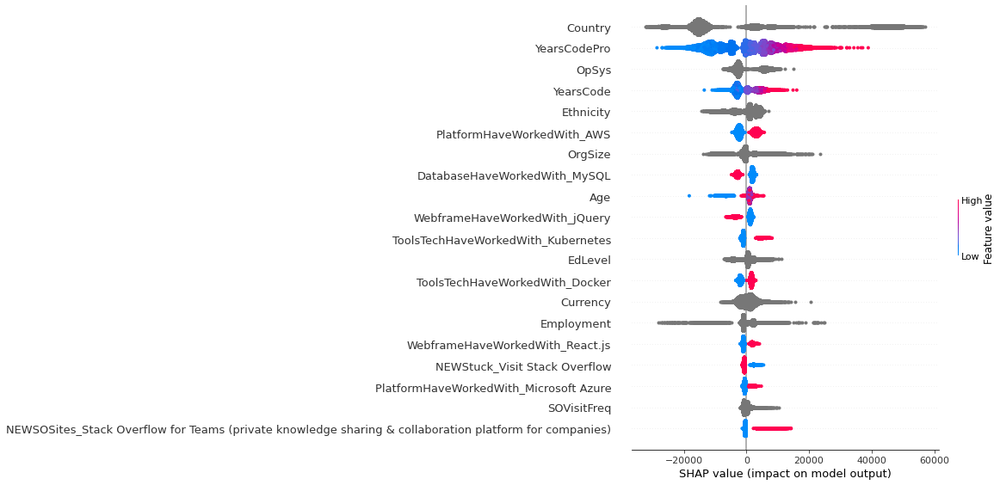

In [97]:
shap.summary_plot(shap_values, X_train, max_display=20)

Теперь закодируем категориальные признаки. Посмотрим есть ли зависимость зарплаты от метки значения.

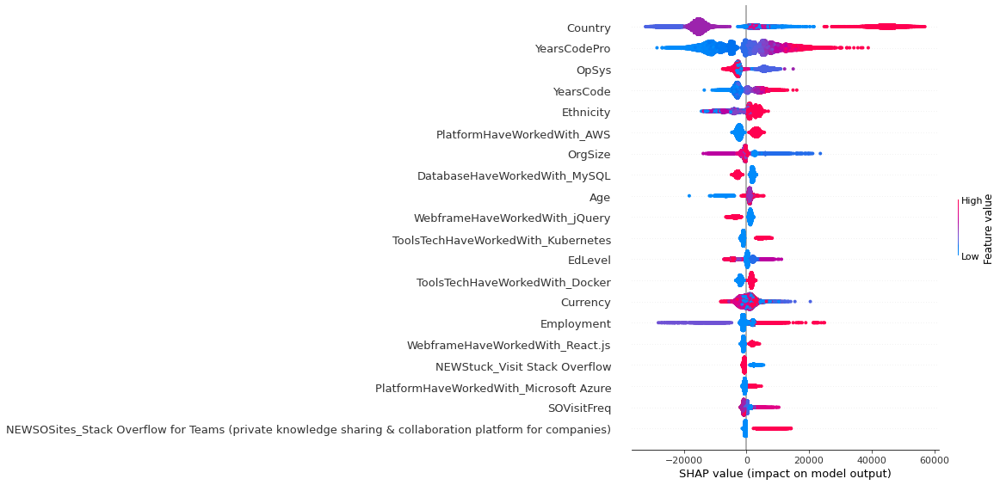

In [98]:
shap.summary_plot(shap_values, X_train_label, max_display=20)

Да, действительно, от значения категориального признака зависит зарплата. Например, для признака `Country` значение `United States of America` закодировано значением 5 (наибольшим), и видим, что высокие значения признака вносят положительный вклад в предсказание зарплаты.

А вот с признаком `OpSys` дело обстоит очень интересно: значения `Windows` и `Windows Subsystem for Linux (WSL)` закодированы соответственно метками 5 и 6, а `Linux-based` и `MacOS` 1 и 2. Видим, ОС Windows вносит отрицательный вклад, в то время как Linux и Mac -- положительный.

Для удобства анализа выведем на экран метку и значение для каждого категориального признака:

In [99]:
for feature_name, values in categorical_names.items():
    print(feature_name)
    for i, val in enumerate(values):
        print(i, '\t', val)
    print()

MainBranch
0 	 I am a developer by profession
1 	 I am not primarily a developer, but I write code sometimes as part of my work

Employment
0 	 Employed full-time
1 	 Employed part-time
2 	 I prefer not to say
3 	 Independent contractor, freelancer, or self-employed
4 	 N/A
5 	 Retired

Country
0 	 Canada
1 	 Germany
2 	 India
3 	 Other
4 	 United Kingdom of Great Britain and Northern Ireland
5 	 United States of America

EdLevel
0 	 Bachelor’s degree (B.A., B.S., B.Eng., etc.)
1 	 Master’s degree (M.A., M.S., M.Eng., MBA, etc.)
2 	 Other
3 	 Other doctoral degree (Ph.D., Ed.D., etc.)
4 	 Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)
5 	 Some college/university study without earning a degree

OrgSize
0 	 1,000 to 4,999 employees
1 	 10,000 or more employees
2 	 100 to 499 employees
3 	 2 to 9 employees
4 	 20 to 99 employees
5 	 Other

Currency
0 	 CAD	Canadian dollar
1 	 EUR European Euro
2 	 GBP	Pound sterling
3 	 INR	Indian rupee
4 	 Other
5 	 US

### Catboost

Так как наилучшее качество показал Catboost, оценим важность признаков и с его помощью. Стоит отметить, что он может оценить важность признаков, используя SHAP values, но мы так делать не будем.

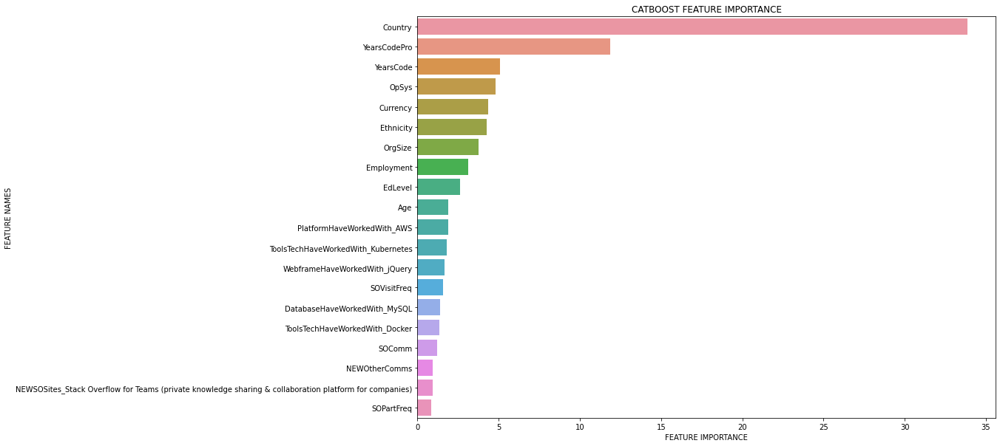

In [100]:
def plot_feature_importance(importance, names, max_display=20):
    
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    
    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    #Define size of bar plot
    plt.figure(figsize=(14,10))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'][:max_display], y=fi_df['feature_names'][:max_display])
    #Add chart labels
    plt.title('CATBOOST FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')
    
    
plot_feature_importance(model.get_feature_importance(), feature_names, max_display=20)

Топ-20 признаков для CatBoost и SHAP почти совпадает, но порядок немного другой, хотя в обоих случаях `Country` выделен как самый важный признак.

## Важность признаков по классам

Так как решается задача регрессии, а требуется анализ по классам, преобразуем целевую переменную следующим образом:

пусть объекты, с зарплатой не более значения медианы на обучающей выборке, принадлежат классу 0, а остальные объекты -- классу 1.

In [101]:
MEDIAN = np.median(y_train)

def get_categorial_y(y):
    y = np.array(y)
    y[np.where(y <= MEDIAN)] = 0
    y[np.where(y > MEDIAN)] = 1
    y = y.ravel()
    return y

y_train_cat = get_categorial_y(y_train)
y_val_cat = get_categorial_y(y_val)
y_test_cat = get_categorial_y(y_test)

По этому критерию поделим значения shap values на значения для класса 0 и для класса 1.

In [102]:
rows_class_0 = np.where(y_train_cat==0)[0]
rows_class_1 = np.where(y_train_cat==1)[0]

X_train_label_class_0 = X_train_label.iloc[rows_class_0, :]
X_train_label_class_1 = X_train_label.iloc[rows_class_1, :]

shap_values_class_0 = shap_values[rows_class_0]
shap_values_class_1 = shap_values[rows_class_1]

Выведем на экран важность признаков для каждого класса.

### Важность признаков для класса 0 (зарплата <= медианы)

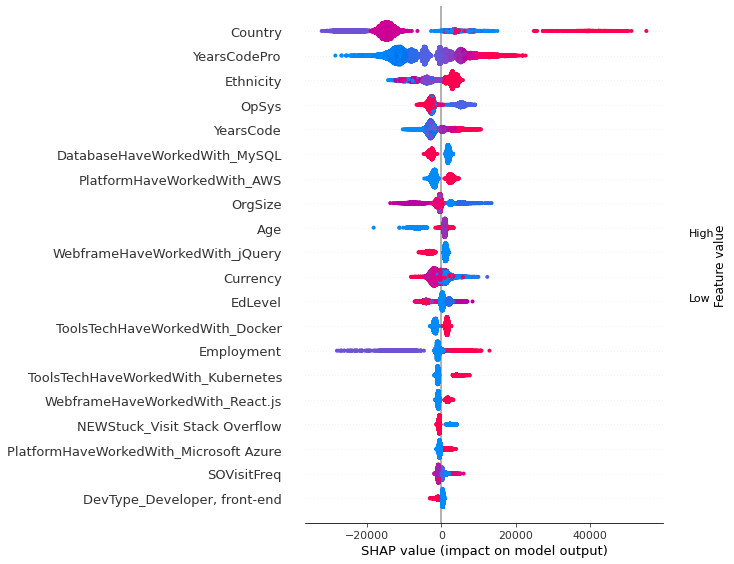

In [103]:
shap.summary_plot(shap_values_class_0, X_train_label_class_0, feature_names, max_display=20)

### Важность признаков для класса 0 (зарплата > медианы)

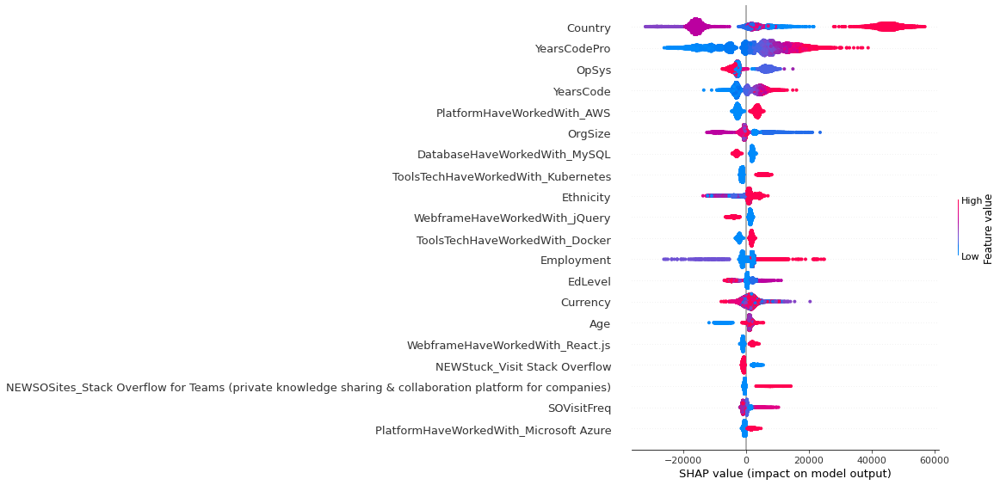

In [104]:
shap.summary_plot(shap_values_class_1, X_train_label_class_1, feature_names, max_display=20)

SHAP values для разных классов похожи, хотя порядок важности признаков немного отличается. Интуитивно казалось, что картинки должны быть зеркальным отражением друг друга, хотя на практике вышло иначе. 

Важность признаков внутри класса и между классами существенно не меняется.

### Разбор примеров

Рассмотрим примеры, где модель предсказывает верно и где ошибается. Так как решается задача регрессии, то в качестве верного предсказания будем брать не точное совпадение предсказания, а предсказания с небольшой абсолютной ошибкой. В качестве неверного предсказания будем брать предсказание с большой абсолютной ошибкой.

In [105]:
small_but_big_predict = 3545
big_but_small_predict = 6217
big_and_big_predict = 8088
small_and_small_predict = 8140

examples  = [small_but_big_predict, big_but_small_predict, big_and_big_predict, small_and_small_predict]

In [107]:
def get_predict(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_test_ = y_test.values.reshape((y_test.shape[0], ))
    return y_test_, y_pred

Выберем 4 примера из тестовой выборки и проанализируем их

## CatBoost

In [108]:
y_test_, y_pred = get_predict(model, X_test, y_test)

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test.iloc[examples,:])

In [109]:
i = 0
example = examples[i]
print('Модель ошиблась: большое предсказание при маленьком значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test.iloc[pid], feature_names=feature_names)

Модель ошиблась: большое предсказание при маленьком значении
Test ID:  3545
Предсказание: 164950
Реальное значение: 48000


In [110]:
i = 1
example = examples[i]
print('Модель ошиблась: маленькое предсказание при большом значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test.iloc[pid], feature_names=feature_names)

Модель ошиблась: маленькое предсказание при большом значении
Test ID:  6217
Предсказание: 29015
Реальное значение: 233496


In [111]:
i = 2
example = examples[i]
print('Модель верно ответила: большое предсказание при большом значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test.iloc[pid], feature_names=feature_names)

Модель верно ответила: большое предсказание при большом значении
Test ID:  8088
Предсказание: 159546
Реальное значение: 165000


In [112]:
i = 3
example = examples[i]
print('Модель верно ответила: маленькое предсказание при маленьком значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test.iloc[pid], feature_names=feature_names)

Модель верно ответила: маленькое предсказание при маленьком значении
Test ID:  8140
Предсказание: 16902
Реальное значение: 13620


## Линейная модель

In [116]:
X_train_ohe = pd.read_csv('./data/processed/X_train_ohe.csv', na_filter=False)
X_val_ohe = pd.read_csv('./data/processed/X_val_ohe.csv', na_filter=False)
X_test_ohe = pd.read_csv('./data/processed/X_test_ohe.csv', na_filter=False)

model = lasso_model

In [117]:
feature_names_ohe = X_train_ohe.columns

In [118]:
y_test_, y_pred = get_predict(model, X_test_ohe, y_test)

explainer = shap.Explainer(model, X_train_ohe, feature_names=feature_names_ohe)
shap_values = explainer.shap_values(X_test_ohe.iloc[examples,:])

In [119]:
i = 0
example = examples[i]
print('Модель ошиблась: большое предсказание при маленьком значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test_ohe.iloc[pid], feature_names=feature_names_ohe)

Модель ошиблась: большое предсказание при маленьком значении
Test ID:  3545
Предсказание: 716790
Реальное значение: 48000


In [120]:
i = 1
example = examples[i]
print('Модель ошиблась: маленькое предсказание при большом значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test_ohe.iloc[pid], feature_names=feature_names_ohe)

Модель ошиблась: маленькое предсказание при большом значении
Test ID:  6217
Предсказание: 113078
Реальное значение: 233496


In [121]:
i = 2
example = examples[i]
print('Модель верно ответила: большое предсказание при большом значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test_ohe.iloc[pid], feature_names=feature_names_ohe)

Модель верно ответила: большое предсказание при большом значении
Test ID:  8088
Предсказание: 416549
Реальное значение: 165000


In [122]:
i = 3
example = examples[i]
print('Модель верно ответила: маленькое предсказание при маленьком значении')
print('Test ID: ', example)
print("Предсказание: %.0f" % y_pred[example])
print("Реальное значение: %.0f" % y_test_[example])

rip, pid = (i, example)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[rip], X_test_ohe.iloc[pid], feature_names=feature_names_ohe)

Модель верно ответила: маленькое предсказание при маленьком значении
Test ID:  8140
Предсказание: 143411
Реальное значение: 13620


# Нейронная сеть